In [1]:
# Treasury Yield Curve data Dataset used

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import scipy
import pylab

import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler

from sklearn.decomposition import PCA
from scipy import exp

from sklearn.linear_model import LinearRegression
from sklearn import svm

import time

In [3]:
# Import data

file = open('E:/大学相关/硕士相关/IE517/Module 5/HW5/hw5_treasury yield curve data.csv')
TY = pd.read_csv(file, index_col='Date')
TY = TY.iloc[::-1]
TY

,SVENF01,SVENF02,SVENF03,SVENF04,SVENF05,SVENF06,SVENF07,SVENF08,SVENF09,SVENF10,...,SVENF22,SVENF23,SVENF24,SVENF25,SVENF26,SVENF27,SVENF28,SVENF29,SVENF30,Adj_Close
Date,,,,,,,,,,,,,,,,,,,,,
1/13/1987,6.2102,6.6709,7.0310,7.3333,7.5890,7.8010,7.9722,8.1067,8.2099,8.2875,...,8.4822,8.4829,8.4834,8.4836,8.4838,8.4840,8.4841,8.4841,8.4841,2.942279
1/14/1987,6.2215,6.6978,7.0637,7.3688,7.6270,7.8421,8.0168,8.1551,8.2619,8.3428,...,8.5503,8.5511,8.5516,8.5519,8.5522,8.5523,8.5524,8.5525,8.5525,2.942279
1/15/1987,6.2195,6.6790,7.0240,7.3172,7.5738,7.7951,7.9805,8.1314,8.2507,8.3430,...,8.5936,8.5946,8.5953,8.5958,8.5961,8.5963,8.5965,8.5966,8.5966,2.942279
1/16/1987,6.2091,6.6589,6.9843,7.2634,7.5140,7.7355,7.9250,8.0814,8.2067,8.3044,...,8.5737,8.5748,8.5756,8.5761,8.5764,8.5767,8.5768,8.5769,8.5770,2.942279
1/20/1987,6.1632,6.6192,6.9560,7.2403,7.4888,7.7032,7.8831,8.0295,8.1454,8.2350,...,8.4777,8.4787,8.4794,8.4799,8.4802,8.4804,8.4805,8.4806,8.4807,2.942279
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5/13/2019,2.1051,2.0234,2.1180,2.2632,2.4051,2.5248,2.6198,2.6940,2.7532,2.8029,...,3.3712,3.4227,3.4735,3.5234,3.5722,3.6196,3.6655,3.7098,3.7525,10.130177
5/14/2019,2.1319,2.0559,2.1451,2.2856,2.4257,2.5461,2.6428,2.7188,2.7791,2.8289,...,3.3940,3.4485,3.5029,3.5568,3.6099,3.6622,3.7132,3.7630,3.8113,10.130177
5/15/2019,2.0874,1.9956,2.0844,2.2289,2.3736,2.4980,2.5984,2.6779,2.7418,2.7951,...,3.3589,3.4086,3.4575,3.5055,3.5524,3.5980,3.6421,3.6847,3.7257,10.150118


In [4]:
# Summary of Data
# Data Information

TY.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8071 entries, 1/13/1987 to 5/17/2019
Data columns (total 31 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   SVENF01    8071 non-null   float64
 1   SVENF02    8071 non-null   float64
 2   SVENF03    8071 non-null   float64
 3   SVENF04    8071 non-null   float64
 4   SVENF05    8071 non-null   float64
 5   SVENF06    8071 non-null   float64
 6   SVENF07    8071 non-null   float64
 7   SVENF08    8071 non-null   float64
 8   SVENF09    8071 non-null   float64
 9   SVENF10    8071 non-null   float64
 10  SVENF11    8071 non-null   float64
 11  SVENF12    8071 non-null   float64
 12  SVENF13    8071 non-null   float64
 13  SVENF14    8071 non-null   float64
 14  SVENF15    8071 non-null   float64
 15  SVENF16    8071 non-null   float64
 16  SVENF17    8071 non-null   float64
 17  SVENF18    8071 non-null   float64
 18  SVENF19    8071 non-null   float64
 19  SVENF20    8071 non-null   float64
 20  

In [5]:
# Summary of Data
# Data Description

TY.describe()

,SVENF01,SVENF02,SVENF03,SVENF04,SVENF05,SVENF06,SVENF07,SVENF08,SVENF09,SVENF10,...,SVENF22,SVENF23,SVENF24,SVENF25,SVENF26,SVENF27,SVENF28,SVENF29,SVENF30,Adj_Close
count,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,...,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000
mean,3.785311,4.258972,4.669363,5.022430,5.318493,5.559644,5.750071,5.895135,6.000596,6.072112,...,5.689046,5.621666,5.554136,5.486943,5.420479,5.355063,5.290948,5.228333,5.167371,5.509793
std,2.648060,2.498137,2.341348,2.221632,2.137801,2.080405,2.040337,2.010786,1.987244,1.966960,...,1.801291,1.797858,1.797012,1.798842,1.803390,1.810643,1.820541,1.832984,1.847834,2.491110
min,0.072700,0.327300,0.630300,1.013000,1.424500,1.698200,1.807300,1.885000,1.942100,1.988200,...,1.489600,1.283000,1.100800,0.941000,0.801800,0.681200,0.577100,0.487600,0.411100,2.801050
25%,1.144050,1.865600,2.536550,3.023050,3.544700,4.063300,4.409750,4.644300,4.774550,4.859500,...,4.177450,4.090550,4.024800,3.982950,3.962100,3.887150,3.840900,3.825050,3.831350,3.130587
50%,3.986500,4.393300,4.505500,4.718900,5.051300,5.394600,5.663700,5.870800,5.993700,6.082400,...,5.619600,5.503000,5.369900,5.228000,5.096700,4.979700,4.860800,4.758600,4.669000,4.956219
75%,5.901500,6.221250,6.461300,6.626600,6.779550,6.908050,7.049900,7.181600,7.297550,7.393350,...,7.330550,7.233200,7.114900,6.998150,6.871050,6.765400,6.650600,6.535450,6.421850,8.051437
max,9.813800,9.887800,10.145600,10.459900,10.649900,10.741400,10.766300,10.747500,10.701500,10.640000,...,10.535100,10.535100,10.535100,10.535100,10.535100,10.535100,10.535100,10.535100,10.535100,10.150118


In [6]:
# Preprocessing
# Finding NA in Dataset

print(TY[TY.isna().any(axis = 1)])

Empty DataFrame
Columns: [SVENF01, SVENF02, SVENF03, SVENF04, SVENF05, SVENF06, SVENF07, SVENF08, SVENF09, SVENF10, SVENF11, SVENF12, SVENF13, SVENF14, SVENF15, SVENF16, SVENF17, SVENF18, SVENF19, SVENF20, SVENF21, SVENF22, SVENF23, SVENF24, SVENF25, SVENF26, SVENF27, SVENF28, SVENF29, SVENF30, Adj_Close]
Index: []

[0 rows x 31 columns]


In [7]:
# There is no empty value in dataset

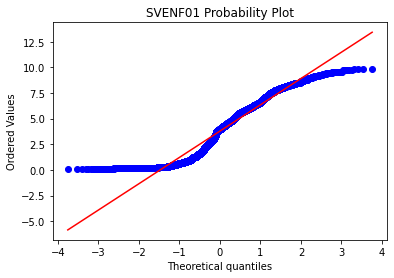

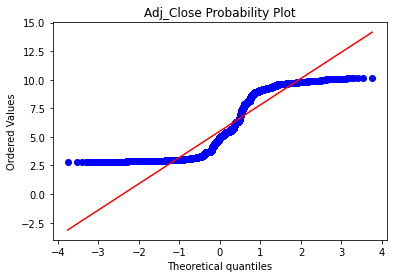

In [8]:
# EDA Part
# Part1 Q-Q Plot

scipy.stats.probplot(TY['SVENF01'], dist = 'norm', plot = pylab)
pylab.title('SVENF01 Probability Plot')
pylab.show()

scipy.stats.probplot(TY['Adj_Close'], dist = 'norm', plot = pylab)
pylab.title('Adj_Close Probability Plot')
pylab.show()

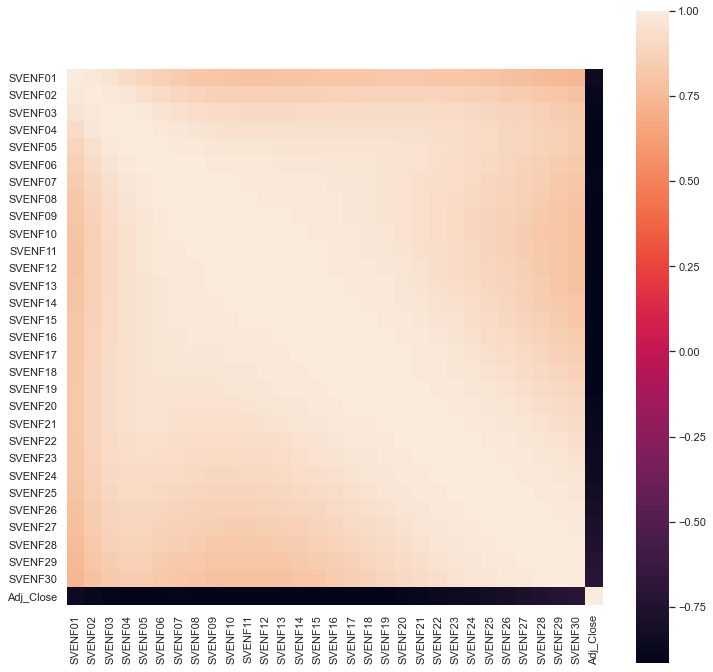

In [9]:
# EDA Part
# Part2 Heatmap

plt.figure(figsize = (12, 12))

cols_name = ['SVENF01', 'SVENF02', 'SVENF03', 'SVENF04', 
             'SVENF05', 'SVENF06', 'SVENF07', 'SVENF08', 
             'SVENF09', 'SVENF10', 'SVENF11', 'SVENF12', 
             'SVENF13', 'SVENF14', 'SVENF15', 'SVENF16', 
             'SVENF17', 'SVENF18', 'SVENF19', 'SVENF20', 
             'SVENF21', 'SVENF22', 'SVENF23', 'SVENF24', 
             'SVENF25', 'SVENF26', 'SVENF27', 'SVENF28', 
             'SVENF29', 'SVENF30', 'Adj_Close']

corr_TY = np.corrcoef(TY[cols_name].values.T)
sns.set(font_scale = 1)
heatmap_TY = sns.heatmap(corr_TY, cbar = True, annot = False, square = True, 
                fmt = '.3f', annot_kws = {'size': 20}, yticklabels = cols_name, 
                xticklabels = cols_name)

plt.show()

<Figure size 1080x1080 with 0 Axes>

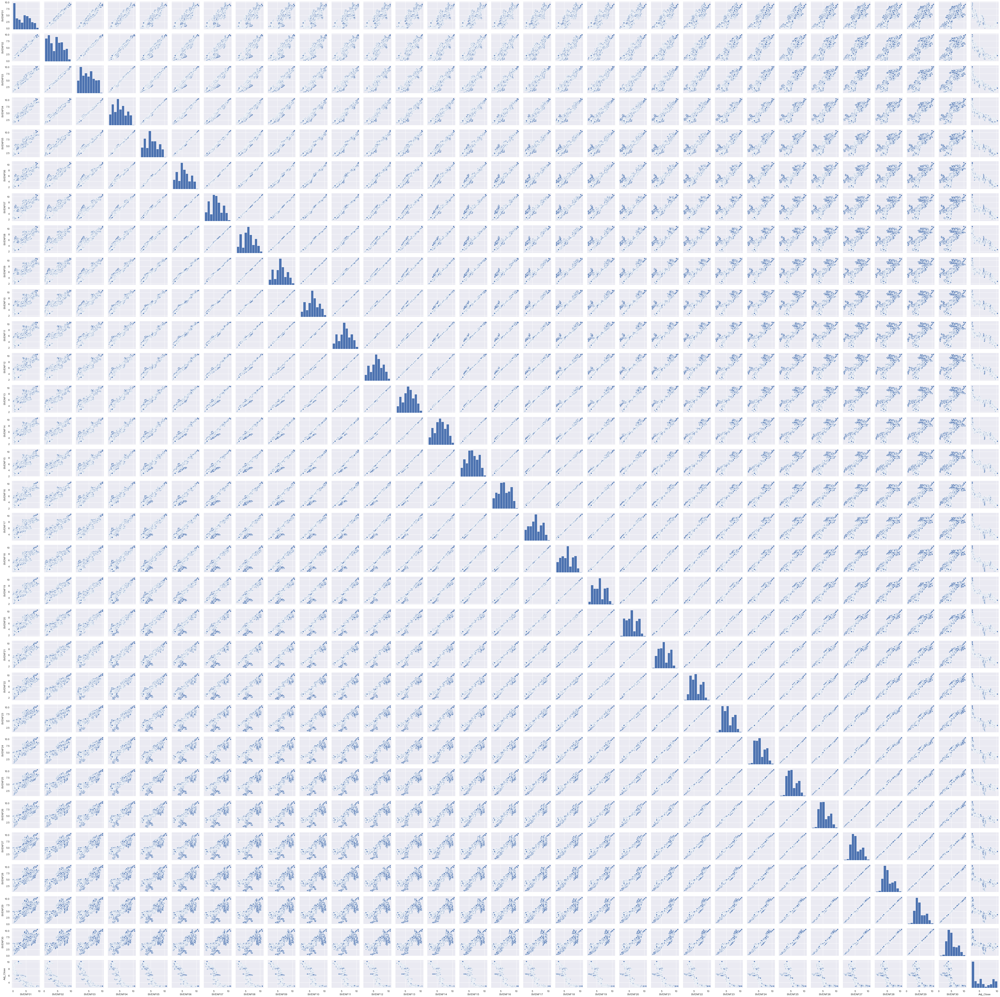

In [10]:
# EDA Part
# Part3 Scatterplot & Histogram

plt.figure(figsize = (15, 15))
sns.pairplot(TY[cols_name], height = 2)
plt.tight_layout()
plt.show()

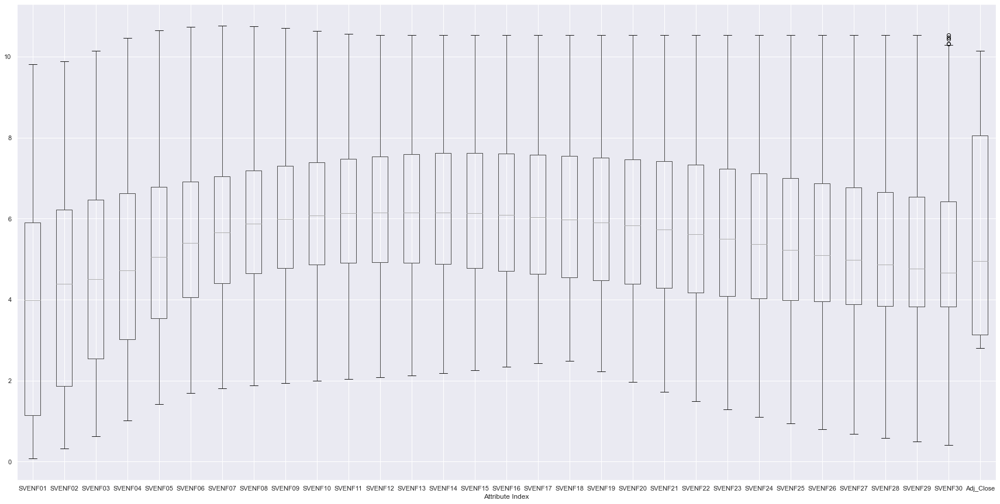

In [11]:
# EDA Part
# Part4 Boxplot

plt.figure(figsize = (30, 15))

f = TY.boxplot()
plt.xlabel("Attribute Index")
plt.show()

In [12]:
# Standization and Train-Test Split 

x_cols_name = TY.drop('Adj_Close', axis = 1).columns
cols_s_name = x_cols_name # We don't select variable this time
X_s = TY.loc[:, cols_s_name].values
y_s = TY['Adj_Close'].values

scalerX = StandardScaler().fit(X_s)
X_std = scalerX.transform(X_s)

scalery = StandardScaler().fit(y_s.reshape(-1,1))
y_std = scalery.transform(y_s.reshape(-1,1))

X_train, X_test, y_train, y_test = train_test_split(X_std, y_std, 
                                                    test_size = 0.15, random_state = 42)

In [13]:
# All features
# Feature Selection

N = 30

In [14]:
# All features
# Linear Regression Part
# Regression

lr = LinearRegression()
start = time.perf_counter()
lr.fit(X_train,y_train)
end = time.perf_counter()
print ("Training time usage is ",end - start," s")
for i in range(N):
    print('Slope of %s is %.3f' % (cols_s_name[i], lr.coef_[0][i]))
print('Intercept is %.3f' % lr.intercept_)

print("*******************************************************************************")
print("Adj_Close =", end ='')
for i in range(N):
    print(" (%.3f*%s) +" % (lr.coef_[0][i], cols_s_name[i]), end ='')
print(" %.3f" % lr.intercept_)
print("*******************************************************************************")

Training time usage is  0.007885799999996834  s
Slope of SVENF01 is -5.190
Slope of SVENF02 is 53.754
Slope of SVENF03 is -233.493
Slope of SVENF04 is 504.242
Slope of SVENF05 is -501.971
Slope of SVENF06 is 17.397
Slope of SVENF07 is 442.569
Slope of SVENF08 is -425.112
Slope of SVENF09 is 132.437
Slope of SVENF10 is 109.155
Slope of SVENF11 is -187.360
Slope of SVENF12 is 174.879
Slope of SVENF13 is 63.781
Slope of SVENF14 is -77.981
Slope of SVENF15 is -269.026
Slope of SVENF16 is 151.667
Slope of SVENF17 is -175.697
Slope of SVENF18 is 128.097
Slope of SVENF19 is 31.714
Slope of SVENF20 is 93.081
Slope of SVENF21 is 355.327
Slope of SVENF22 is -178.932
Slope of SVENF23 is 246.896
Slope of SVENF24 is -284.619
Slope of SVENF25 is -732.066
Slope of SVENF26 is 33.187
Slope of SVENF27 is 216.364
Slope of SVENF28 is 531.310
Slope of SVENF29 is 148.088
Slope of SVENF30 is -363.233
Intercept is -0.001
*******************************************************************************
Adj_Close

(-1.0, 1.0)

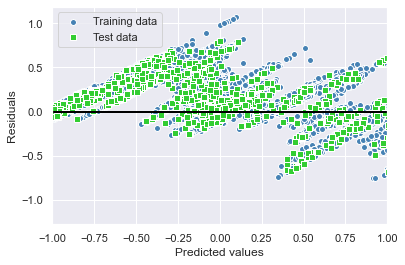

In [15]:
# All features
# Linear Regression Part
# Residual Errors

y_train_pred_lr = lr.predict(X_train)
y_test_pred_lr = lr.predict(X_test)
plt.scatter(y_train_pred_lr,  y_train_pred_lr - y_train, 
            c = 'steelblue', marker = 'o', edgecolor = 'white',label = 'Training data')
plt.scatter(y_test_pred_lr,  y_test_pred_lr - y_test,
            c = 'limegreen', marker = 's', edgecolor = 'white',label = 'Test data')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')
plt.legend(loc = 'upper left')
plt.hlines(y = 0, xmin = -1, xmax = 1, color = 'black', lw = 2)
plt.xlim([-1, 1])

In [16]:
# All features
# Linear Regression Part
# MSE

print('Linear Regression MSE train: %.3f, test: %.3f' 
      % (mean_squared_error(y_train, y_train_pred_lr),
         mean_squared_error(y_test, y_test_pred_lr)))

Linear Regression MSE train: 0.098, test: 0.094


In [17]:
# All features
# Linear Regression Part
# R^2

print('Linear Regression R^2 train: %.3f, test: %.3f' 
      % (r2_score(y_train, y_train_pred_lr),
         r2_score(y_test, y_test_pred_lr)))

Linear Regression R^2 train: 0.902, test: 0.904


In [18]:
# All features
# SVR
# Regression

svr=svm.SVR(kernel="rbf")
start = time.perf_counter()
svr.fit(X_train,y_train)
end = time.perf_counter()
print ("Training time usage is ",end - start," s")

print("SVR train succeed!")

D:\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


Training time usage is  0.7520426000000384  s
SVR train succeed!


(-1.0, 1.0)

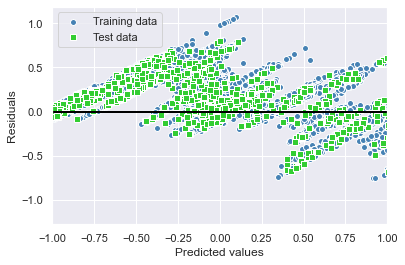

In [19]:
# All features
# SVR Part
# Residual Errors

y_train_pred_svr = svr.predict(X_train)
y_test_pred_svr = svr.predict(X_test)
plt.scatter(y_train_pred_lr,  y_train_pred_lr - y_train, 
            c = 'steelblue', marker = 'o', edgecolor = 'white',label = 'Training data')
plt.scatter(y_test_pred_lr,  y_test_pred_lr - y_test,
            c = 'limegreen', marker = 's', edgecolor = 'white',label = 'Test data')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')
plt.legend(loc = 'upper left')
plt.hlines(y = 0, xmin = -1, xmax = 1, color = 'black', lw = 2)
plt.xlim([-1, 1])


In [20]:
# All features
# SVR Part
# MSE

print('SVR MSE train: %.3f, test: %.3f' 
      % (mean_squared_error(y_train, y_train_pred_svr),
         mean_squared_error(y_test, y_test_pred_svr)))

SVR MSE train: 0.011, test: 0.010


In [21]:
# All features
# SVR Part
# R^2

print('SVR R^2 train: %.3f, test: %.3f' 
      % (r2_score(y_train, y_train_pred_svr),
         r2_score(y_test, y_test_pred_svr)))

SVR R^2 train: 0.989, test: 0.990


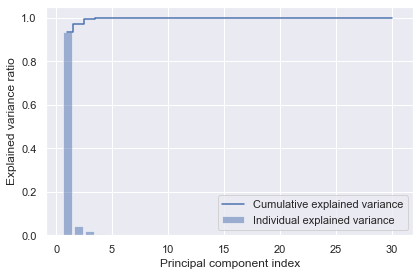

In [22]:
# PCA

# Eigendecomposition of the covariance matrix.
cov_mat = np.cov(X_train.T)
eigen_vals, eigen_vecs = np.linalg.eig(cov_mat)

# Total and explained variance
tot = sum(eigen_vals)
var_exp =[ (i / tot) for i in sorted(eigen_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
var_exp =np.array( [(i / tot) for i in sorted(eigen_vals, reverse=True)])

plt.bar(range(1, 31), var_exp, alpha=0.5, align='center',
        label='Individual explained variance')
plt.step(range(1, 31), cum_var_exp, where='mid',
         label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [23]:
# PCA Part
# Feature Selection

N = 3

pca = PCA(n_components = N)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)
print("The cumulative explained variance of 3 pca features:")
print(pca.explained_variance_ratio_)

The cumulative explained variance of 3 pca features:
[0.93158185 0.04096821 0.02180102]


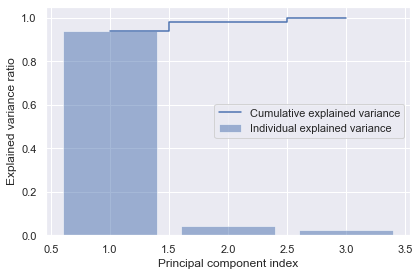

In [24]:
# PCA

# Eigendecomposition of the covariance matrix.
cov_mat = np.cov(X_train_pca.T)
eigen_vals, eigen_vecs = np.linalg.eig(cov_mat)

# Total and explained variance
tot = sum(eigen_vals)
var_exp =[ (i / tot) for i in sorted(eigen_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
var_exp =np.array( [(i / tot) for i in sorted(eigen_vals, reverse=True)])

plt.bar(range(1, 4), var_exp, alpha=0.5, align='center',
        label='Individual explained variance')
plt.step(range(1, 4), cum_var_exp, where='mid',
         label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [25]:
# PCA
# Linear Regression Part
# Regression

lr = LinearRegression()
start = time.perf_counter()
lr.fit(X_train_pca,y_train)
end = time.perf_counter()
print ("Training time usage is ",end - start," s")
for i in range(N):
    print('Slope of X%i is %.3f' % (i + 1, lr.coef_[0][i]))
print('Intercept is %.3f' % lr.intercept_)

print("*******************************************************************************")
print("Adj_Close =", end ='')
for i in range(N):
    print(" (%.3f*X%i) +" % (lr.coef_[0][i], i + 1), end ='')
print(" %.3f" % lr.intercept_)
print("*******************************************************************************")

Training time usage is  0.0026559000000361266  s
Slope of X1 is -0.171
Slope of X2 is -0.192
Slope of X3 is 0.106
Intercept is 0.004
*******************************************************************************
Adj_Close = (-0.171*X1) + (-0.192*X2) + (0.106*X3) + 0.004
*******************************************************************************


(-1.0, 1.0)

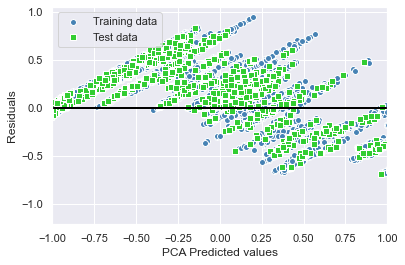

In [26]:
# PCA Part
# Linear Regression Part
# Residual Errors

y_train_pred_lr = lr.predict(X_train_pca)
y_test_pred_lr = lr.predict(X_test_pca)
plt.scatter(y_train_pred_lr,  y_train_pred_lr - y_train, 
            c = 'steelblue', marker = 'o', edgecolor = 'white',label = 'Training data')
plt.scatter(y_test_pred_lr,  y_test_pred_lr - y_test,
            c = 'limegreen', marker = 's', edgecolor = 'white',label = 'Test data')
plt.xlabel('PCA Predicted values')
plt.ylabel('Residuals')
plt.legend(loc = 'upper left')
plt.hlines(y = 0, xmin = -1, xmax = 1, color = 'black', lw = 2)
plt.xlim([-1, 1])

In [27]:
# PCA
# Linear Regression Part
# MSE

print('PCA Linear Regression MSE train: %.3f, test: %.3f' 
      % (mean_squared_error(y_train, y_train_pred_lr),
         mean_squared_error(y_test, y_test_pred_lr)))

PCA Linear Regression MSE train: 0.133, test: 0.132


In [28]:
# PCA
# Linear Regression Part
# R^2

print('PCA Linear Regression R^2 train: %.3f, test: %.3f' 
      % (r2_score(y_train, y_train_pred_lr),
         r2_score(y_test, y_test_pred_lr)))

PCA Linear Regression R^2 train: 0.867, test: 0.866


In [29]:
# PCA
# SVR Part
# Regression

svr=svm.SVR(kernel = "rbf")
start = time.perf_counter()
svr.fit(X_train_pca, y_train)
end = time.perf_counter()
print ("Training time usage is ",end - start," s")

print("SVR train succeed!")

D:\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


Training time usage is  0.751719899999955  s
SVR train succeed!


(-1.0, 1.0)

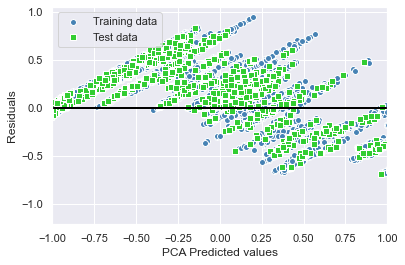

In [30]:
# PCA
# SVR Part
# Residual Errors

y_train_pred_svr = svr.predict(X_train_pca)
y_test_pred_svr = svr.predict(X_test_pca)
plt.scatter(y_train_pred_lr,  y_train_pred_lr - y_train, 
            c = 'steelblue', marker = 'o', edgecolor = 'white',label = 'Training data')
plt.scatter(y_test_pred_lr,  y_test_pred_lr - y_test,
            c = 'limegreen', marker = 's', edgecolor = 'white',label = 'Test data')
plt.xlabel('PCA Predicted values')
plt.ylabel('Residuals')
plt.legend(loc = 'upper left')
plt.hlines(y = 0, xmin = -1, xmax = 1, color = 'black', lw = 2)
plt.xlim([-1, 1])

In [31]:
# PCA
# SVR Part
# MSE

print('PCA SVR MSE train: %.3f, test: %.3f' 
      % (mean_squared_error(y_train, y_train_pred_svr),
         mean_squared_error(y_test, y_test_pred_svr)))

PCA SVR MSE train: 0.021, test: 0.019


In [32]:
# PCA
# SVR Part
# R^2

print('PCA SVR R^2 train: %.3f, test: %.3f' 
      % (r2_score(y_train, y_train_pred_svr),
         r2_score(y_test, y_test_pred_svr)))

PCA SVR R^2 train: 0.979, test: 0.981


In [33]:
print("My name is Jingfan Xing")
print("My NetID is: jingfan5")
print("I hereby certify that I have read the University policy on Academic Integrity and that I am not in violation.")

My name is Jingfan Xing
My NetID is: jingfan5
I hereby certify that I have read the University policy on Academic Integrity and that I am not in violation.
